In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import jax
import jax.numpy as jnp
import numpy as np
import diffrax
import matplotlib.pyplot as plt

from soromox.systems.tendon_actuated_planar_pcs import TendonActuatedPlanarPCS

from controllers.MPPI import ModelPredictivePathIntegralControl

In [5]:
num_segments = 1  # number of segments in the robot
params = {
    "th0": jnp.array(-jnp.pi / 2),  # initial orientation angle [rad]
    "L": 1e-1 * jnp.ones((num_segments,)),
    "r": 2e-2 * jnp.ones((num_segments,)),
    "rho": 1070 * jnp.ones((num_segments,)),  # Volumetric density of Dragon Skin 20 [kg/m^3]
    "g": jnp.array([0.0, 9.81]),  # gravitational acceleration [m/s^2] UP!
    "E": 5e3 * jnp.ones((num_segments,)),  # Elastic modulus [Pa]
    "G": 1e3 * jnp.ones((num_segments,)),  # Shear modulus [Pa]
    "d": 2e-2 * jnp.array([[1.0, -1.0]]).repeat(num_segments, axis=0),  # distance of tendons from the central axis [m]
}
params["D"] = 1e-3 * jnp.diag((jnp.repeat(jnp.array([[1e0, 1e3, 1e3]]), num_segments, axis=0) * params["L"][:, None]).flatten())
strain_selector = jnp.ones((3 * num_segments,), dtype=bool) # activate all strains (i.e. bending, shear, and axial)
segment_actuation_selector = jnp.ones((num_segments,), dtype=bool)  # actuation selector for the segments

robot = TendonActuatedPlanarPCS(num_segments=num_segments, params=params, strain_selector=strain_selector, segment_actuation_selector=segment_actuation_selector)

nx = 2 * 3 * num_segments
nu = 2 * num_segments

dynamics_model = lambda t, x, u: robot.simplified_forward_dynamics(t, x, (u,))

In [7]:
N = 30
dt = 0.01
Q = jnp.diag(jnp.array([100.0]*int(nx/2) + [1.0]*int(nx/2)))
R = jnp.diag(jnp.array([0.01]*nu))

chi_eq = jnp.array([[-jnp.pi/2, 0.0, -robot.L[0]]])
q_eq = robot.inverse_kinematics(chi_eq)
qd_eq = jnp.zeros_like(q_eq)
x_eq = jnp.concatenate([q_eq, qd_eq])
u_eq = jnp.zeros(nu)

q0 = robot.inverse_kinematics(jnp.array([[1.24938484, 0.06924939, 0.01221363]]))
qd0 = jnp.zeros_like(q0)
x0 = jnp.concatenate([q0, qd0])

controller = ModelPredictivePathIntegralControl(dynamics_model, N, dt, nu, Q, R, x_eq, u_max=2.0, sigma=0.1, correlation=0.9)

In [8]:
controller.compute_trajectory_cost(controller.control_input, x_eq)

Array([[15.61971285]], dtype=float64)

In [9]:
controller.auto_choose_temperature(x0)

291172.5628693276 0.0003434389525392129


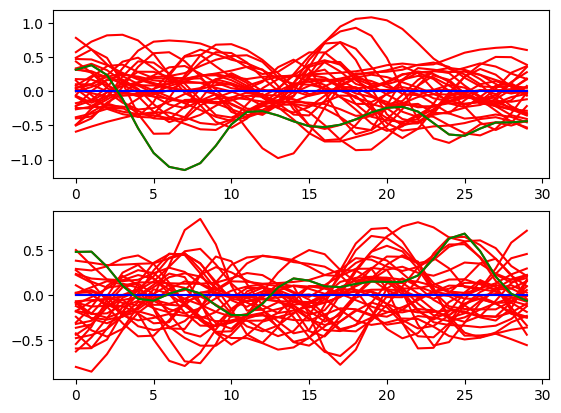

[ 0. -0.]


In [10]:
u_sample = controller.sample_u(controller.mu, controller.Sigma)
J_sample = controller.batch_compute_trajectory_cost(u_sample, x0)
m, S, w = controller.update_distribution(u_sample, J_sample, update_variance=True)

fig, ax = plt.subplots(2, 1)
ax[0].plot(u_sample[:, 0, :].T, c='r')
ax[0].plot(controller.control_input[0, :], c='b')
ax[0].plot(m[0, :], c='g')
ax[1].plot(u_sample[:, 1, :].T, c='r')
ax[1].plot(controller.control_input[1, :], c='b')
ax[1].plot(m[1, :], c='g')
plt.show()

controller.mu = m
# controller.Sigma = S
print(jnp.linalg.det(S))

In [11]:
# ---------------------------------------------------------
# 4. SIMULATION USING JAX REAL DYNAMICS
# ---------------------------------------------------------
@jax.jit
def simulate_step(t, x, u):
    sol = diffrax.diffeqsolve(terms=diffrax.ODETerm(robot.forward_dynamics), solver=diffrax.Tsit5(), t0=t, t1=t+dt, dt0=1e-4, y0=x, args=(u,), saveat=diffrax.SaveAt(ts=[t+dt]))
    return sol.ys

T_sim = 2.0
steps = int(T_sim / dt)

t = 0.0
x = x0

controller.solve(x, num_iter=10)

trajectory_x = [x]
trajectory_u = []
trajectory_cost = x.T @ controller.Q @ x
s_batch = jnp.linspace(0.0, robot.L.sum(), 100)
trajectory_pos = [robot.forward_kinematics_batched(jnp.split(x, 2)[0], s_batch)]

for step in range(steps):
    compute_times = controller.solve(x)
    print(controller.compute_trajectory_cost(controller.control_input, x).squeeze(), compute_times)
    u = controller.get_control_input_and_step()
    x = np.asarray(simulate_step(t, x, u)).squeeze()
    t += dt
    trajectory_x.append(x)
    trajectory_u.append(u)
    trajectory_cost += x.T @ controller.Q @ x + u.T @ controller.R @ u
    trajectory_pos.append(robot.forward_kinematics_batched(jnp.split(x, 2)[0], s_batch))

trajectory_x = np.array(trajectory_x).reshape(steps+1, nx, 1)
trajectory_u = np.array(trajectory_u).reshape(steps, nu, 1)
trajectory_pos = np.array(trajectory_pos)
trajectory_t = np.arange(trajectory_x.shape[0]) * dt

print("Finished closed loop simulation.")
print("Trajectory Cost: ", trajectory_cost * dt)

1667675.8019468295 {'sampling': 0.0006230669996512006, 'trajectory cost': 0.5548649070005922, 'update': 0.00381595799990464}
1621409.2421483158 {'sampling': 0.000821524999992107, 'trajectory cost': 0.6553298590006307, 'update': 0.004638262999833387}
1575581.5875304076 {'sampling': 0.0007851820000723819, 'trajectory cost': 0.6464325090000784, 'update': 0.0043567360007727984}
1531736.472619839 {'sampling': 0.0005505869994522072, 'trajectory cost': 0.43572102899997844, 'update': 0.003700735000165878}
1490533.815480002 {'sampling': 0.0005485789997692336, 'trajectory cost': 0.4421739469999011, 'update': 0.003931934000320325}
1435747.993202501 {'sampling': 0.0007078759999785689, 'trajectory cost': 0.5065435919996162, 'update': 0.0035588849996202043}
1393375.1696503782 {'sampling': 0.0006767889999537147, 'trajectory cost': 0.45750529099950654, 'update': 0.003091895000579825}
1354435.6402898557 {'sampling': 0.0006108810002842802, 'trajectory cost': 0.5003718950001712, 'update': 0.0041347639999

In [12]:
# trajectory_x = np.array(trajectory_x[:-1]).reshape(-1, nx, 1)
# trajectory_u = np.array(trajectory_u[:-1]).reshape(-1, nu, 1)
# trajectory_pos = np.array(trajectory_pos[:-1])
# trajectory_t = np.arange(trajectory_x.shape[0]) * dt

In [13]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

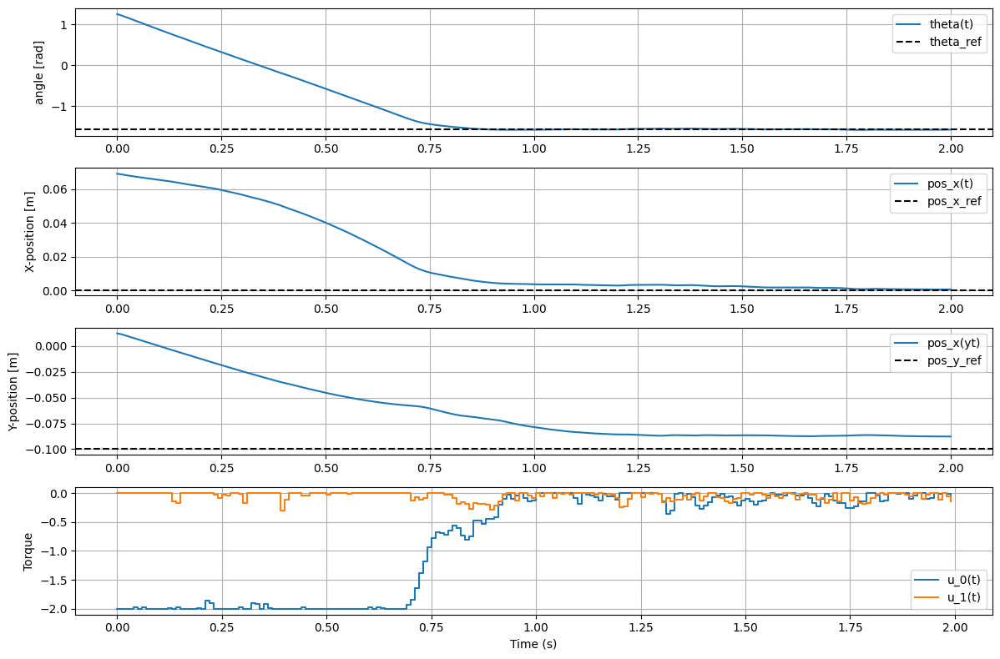

In [14]:
plt.figure(figsize=(12,8))

# -----------------------------
# Plot theta
# -----------------------------
plt.subplot(4,1,1)
plt.plot(trajectory_t, trajectory_pos[:, -1, 0], label="theta(t)")
plt.axhline(chi_eq[-1, 0], color="k", linestyle="--", label="theta_ref")
plt.ylabel("angle [rad]")
plt.legend()
plt.grid(True)

# -----------------------------
# Plot X position
# -----------------------------
plt.subplot(4,1,2)
plt.plot(trajectory_t, trajectory_pos[:, -1, 1], label="pos_x(t)")
plt.axhline(chi_eq[-1, 1], color="k", linestyle="--", label="pos_x_ref")
plt.ylabel("X-position [m]")
plt.legend()
plt.grid(True)

# -----------------------------
# Plot Y position
# -----------------------------
plt.subplot(4,1,3)
plt.plot(trajectory_t, trajectory_pos[:, -1, 2], label="pos_x(yt)")
plt.axhline(chi_eq[-1, 2], color="k", linestyle="--", label="pos_y_ref")
plt.ylabel("Y-position [m]")
plt.legend()
plt.grid(True)

# -----------------------------
# Plot Control Input
# -----------------------------
plt.subplot(4,1,4)
for i in range(trajectory_u.shape[1]):
    plt.step(trajectory_t[:-1], trajectory_u[:, i].squeeze(), where="post", label=f"u_{i}(t)")
plt.ylabel("Torque")
plt.xlabel("Time (s)")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [15]:
n_t, n_s, _ = trajectory_pos.shape

# --- 2. Setup Plot and Update Function ---

# Determine the overall bounds for the combined data
data_min = np.min(trajectory_pos[:, :, 1:])
data_max = np.max(trajectory_pos[:, :, 1:])
buffer = (data_max - data_min) * 0.1

# Initialize plot
fig, ax = plt.subplots(figsize=(7, 7))
ax.set_title(f'Comparison of {n_s} Points from Two Batches', fontsize=14)
ax.set_xlabel('X Position')
ax.set_ylabel('Y Position')
ax.set_aspect('equal', adjustable='box')
ax.grid(True, linestyle='--')
ax.set_xlim(data_min - buffer, data_max + buffer)
ax.set_ylim(data_min - buffer, data_max + buffer)
ax.yaxis.set_inverted(True)

# Initial scatter plots
target_plot = ax.scatter(chi_eq[-1, 1], chi_eq[-1, 2], s=200, c='r', marker='o')
traj_plot = ax.scatter(trajectory_pos[0, :, 1], trajectory_pos[0, :, 2], s=100, c='b', marker='o')

# Legend and Time Step Annotation
time_template = 'Time Step = %d / %d'
time_text = ax.text(0.05, 0.95, '', transform=ax.transAxes, backgroundcolor='w')

def update(frame):
    """Updates the position of both scatter plots for the given frame (time step)"""
    # Update Batch 1 (Blue)
    X1, Y1 = trajectory_pos[frame, :, 1], trajectory_pos[frame, :, 2]
    traj_plot.set_offsets(list(zip(X1, Y1)))
    
    # Update time text
    time_text.set_text(time_template % (frame + 1, n_t))
    
    # Return both scatter objects and the text object
    return traj_plot, time_text

# --- 3. Create Animation and Display in Notebook ---

ani = FuncAnimation(fig, update, frames=n_t, blit=True, interval=50)

# Close the figure
plt.close(fig)

# Convert the animation to an HTML string and display it
HTML(ani.to_jshtml())

(33, 2, 30) (2, 30)


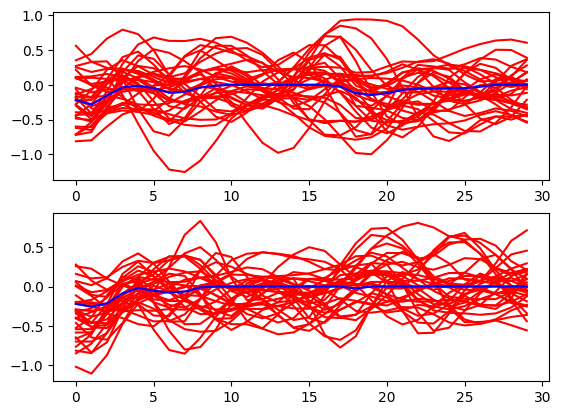

[  109.7593604   4243.66945921  1162.79180421  4006.21241536
   910.63292877  1390.29863448   305.0673724   1289.65733408
  1705.44355766   814.95739422  1277.36572994  1277.61355156
  2017.48138898  2171.08457322   562.52768254  2050.15084379
   912.17123508  3663.92358312 12810.02026084  1243.22252383
  2278.57340266   251.2257515    911.84637864  2649.56283388
   572.6286655   1748.09066532  1493.15275926  1769.04841896
  1887.19502625   855.85502947  1797.8815789   3397.35865585
   481.84733528]


In [16]:
u_sample = controller.sample_u(controller.mu, controller.Sigma, add_zero_sample=True)
u_apply = controller.control_input
print(u_sample.shape, u_apply.shape)

fig, ax = plt.subplots(2, 1)
ax[0].plot(u_sample[:, 0, :].T, c='r')
ax[0].plot(u_apply[0, :], c='b')
ax[1].plot(u_sample[:, 1, :].T, c='r')
ax[1].plot(u_apply[1, :], c='b')
plt.show()

print(controller.batch_compute_trajectory_cost(u_sample, x).squeeze())